In [1]:
import pandas as pd
import numpy as np

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt 

! pip install shapely
import shapely 
from shapely.geometry import point, polygon 

! pip install descartes
import descartes 


# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library

from sklearn.cluster import DBSCAN 
import time 
from sklearn import metrics
from geopy.distance import great_circle 
from shapely.geometry import MultiPoint 

print('Libraries imported.') 
    

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.8.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2019.11.28         |           py36_0         149 KB  conda-forge
    scikit-learn-0.20.1        |   py36h22eb022_0         5.7 MB
    liblapack-3.8.0            |      11_openblas          10 KB  conda-forge
    liblapacke-3.8.0           |      11_openblas          10 KB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    libopenblas-0.3.6          |       h5a2b251_2         7.7 MB
    numpy-1.17.3               |   py36h95a1406_0         5.2 MB  conda-forge
    sci

In [24]:
#Read the data from the directory into the notebook
RestaurantData = pd.read_csv("RestaurantData.csv")
RestaurantData.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (10,99,101,102,103,105,106,107,109,110) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Restaurant Name,Inspection Type,Inspection Date,Inspection Score,Street Number,Street Name,Street Direction,Street Type,Street Unit,Street Address,...,Violation Points - 24,Violation Detail - 24,Violation Memo - 24,Violation Description - 25,Violation Points - 25,Violation Detail - 25,Violation Memo - 25,Inspection Month,Inspection Year,Lat Long Location
0,BANGKOK CITY ON GREENVILLE,Routine,06/18/2019,91,4503,GREENVILLE,NaN,AVE,NaN,4503 GREENVILLE AVE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jun 2019,FY2019,"4503 GREENVILLE AVE\n(32.84223, -96.770156)"
1,FRESHII,Routine,10/31/2018,96,2414,VICTORY PARK,NaN,LN,NaN,2414 VICTORY PARK LN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Oct 2018,FY2019,"2414 VICTORY PARK LN\n(32.787625, -96.809294)"
2,CENTERPLATE SANDWICH ZONE #6,Routine,06/19/2019,100,650,GRIFFIN,S,ST,NaN,650 S GRIFFIN ST,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jun 2019,FY2019,"650 S GRIFFIN ST\n(32.772703, -96.799217)"
3,WORLD TRADE CENTER MARKET,Routine,11/03/2016,100,2050,STEMMONS,N,FRWY,NaN,2050 N STEMMONS FRWY,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Nov 2016,FY2017,"2050 N STEMMONS FRWY\n(32.801934, -96.825878)"
4,MARRIOTT/ ROOM SERVICE KITCHEN,Routine,06/27/2019,100,650,PEARL,N,EXPW,NaN,650 N PEARL EXPW,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jun 2019,FY2019,650 N PEARL EXPW


In [25]:
RestaurantData.shape

(40213, 114)

## DATA CLEANING

In [7]:
#Drop duplicate rows 
#Selects columns that are needed and places them in a new dataframe
#puts the latitude/latitude in a new column & displays the new dataframe 
RestaurantData.drop_duplicates(keep= 'first', inplace = True )
Restaurant_data = RestaurantData.iloc[:, np.r_[0:1, 9:11, 113:114]].copy(deep = True)
Restaurant_data.iloc[:,3] = Restaurant_data["Lat Long Location"].str.split("\n").str[1]
Restaurant_data['Latitude']=Restaurant_data['Lat Long Location'].str.split(',').str[0]
Restaurant_data['Longitude']=Restaurant_data['Lat Long Location'].str.split(',').str[1]
Restaurant_data.iloc[:,4]= Restaurant_data['Latitude'].str.strip('(')
Restaurant_data.iloc[:,5]= Restaurant_data['Longitude'].str.strip(')')
Restaurant_data.rename(columns ={'Restaurant Name':'RestaurantName'}, inplace = True)
Restaurant_data.head()

,RestaurantName,Street Address,Zip Code,Lat Long Location,Latitude,Longitude
0,BANGKOK CITY ON GREENVILLE,4503 GREENVILLE AVE,75206,"(32.84223, -96.770156)",32.84223,-96.770156
1,FRESHII,2414 VICTORY PARK LN,75219,"(32.787625, -96.809294)",32.787625,-96.809294
2,CENTERPLATE SANDWICH ZONE #6,650 S GRIFFIN ST,75202,"(32.772703, -96.799217)",32.772703,-96.799217
3,WORLD TRADE CENTER MARKET,2050 N STEMMONS FRWY,75207,"(32.801934, -96.825878)",32.801934,-96.825878
4,MARRIOTT/ ROOM SERVICE KITCHEN,650 N PEARL EXPW,75201,NaN,NaN,NaN


In [8]:
RestaurantData2 = Restaurant_data.copy(deep = False) #We may need this clone 

In [9]:
# Let's ConverT the Latitude/Longitude columns to numeric values so we can Visulaize them
Restaurant_data2 = Restaurant_data.copy(deep = False) 
Restaurant_data2 = Restaurant_data2.dropna() #drops columns with NaN values 

In [10]:
#More Cleaning of the dataframe, drop duplicate and change wrong zipcodes 
Restaurant_data2.drop_duplicates(keep= 'first', inplace = True ) #Size of new dataframe.
RestaurantData2 = Restaurant_data2.copy(deep = False) #We will need this clone 
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '75230-6114'] = '75230' 
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '75243-4217'] = '75243'
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752435219'] = '75243' 
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752062802'] = '75206' 
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752172042'] = '75217' 
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '75228-3007'] = '75228'
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752172042'] = '75217'
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752096384'] = '75209'
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752203832'] = '75230' 
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752302426'] = '75230'
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752124029'] = '75230' 
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '75236-1078'] = '75236'
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '752302426'] = '75230' 
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == '75228-6371'] = '75230'
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == 752096384 ] = '75209'
Restaurant_data2.loc[Restaurant_data2['Zip Code'] == 752302426 ] = '75230' 


In [11]:
cols = ['Latitude', 'Longitude', ]
Restaurant_data2[cols] = Restaurant_data2[cols].apply(pd.to_numeric)

In [12]:
for index, row in Restaurant_data2.iterrows():
    if row['Latitude'] > 1000:
        Restaurant_data2.drop(index, inplace=True)
        
Restaurant_data2.shape

(12809, 6)

## Visualization with Folium

In [13]:
address = 'Dallas, Tx '

geolocator = Nominatim(user_agent="dallas_explorer")
location = geolocator.geocode(address)
latitude = location.latitude


longitude = location.longitude
print('The geograpical coordinate of Dallas, Tx are {}, {}.'.format(latitude, longitude))



The geograpical coordinate of Dallas, Tx are 32.7762719, -96.7968559.


In [14]:
Restaurant_map = folium.Map(location=[latitude, longitude], zoom_start=13) # generate map centred around Dallas, Tx. 


for label, lat, lng, in zip(Restaurant_data2['RestaurantName'], Restaurant_data2['Latitude'], Restaurant_data2['Longitude']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
         [lat, lng],
         radius=5,
         popup=label,
         color='blue',
         fill=True,
         fill_color='#3186cc',
         fill_opacity=0.7,
         parse_html=False).add_to(Restaurant_map)
# display map
Restaurant_map

## CLUSTERING THE DATA USING THE LAT/LONG POINTS AND DBSCAN CLUSTERING TECHNIQUE



In [15]:
# define the number of kilogram in one radian 
kms_per_radian = 6371.0088

### COMPUTE DBSCAN



In [16]:
# represent points 
coords = Restaurant_data2[['Latitude','Longitude']].values

#define episilon as 300 kilometers, converted to radians for the use of haversine 
epsilon = 300/ kms_per_radian 

In [17]:
start_time = time.time()
db = DBSCAN(eps=epsilon, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
cluster_labels = db.labels_

# get the number of clusters
num_clusters = len(set(cluster_labels))

In [18]:
# all done, print the outcome
message = 'Clustered {:,} points down to {:,} clusters, for {:.1f}% compression in {:,.2f} seconds'
print(message.format(len(Restaurant_data2), num_clusters, 100*(1 - float(num_clusters) / len(Restaurant_data2)), time.time()-start_time))
print('Silhouette coefficient: {:0.03f}'.format(metrics.silhouette_score(coords, cluster_labels)))

Clustered 12,809 points down to 6 clusters, for 100.0% compression in 4.38 seconds
Silhouette coefficient: 0.729


In [19]:
#Let us insert the clusters in the dataframe 
#Restaurant_data2.insert(0, 'Cluster Labels', db.labels_) 

# Put the clusters in dataframes and analyze them to choose the best location for our new restaurant


In [20]:
CLUSTER0 = Restaurant_data2.loc[Restaurant_data2['Cluster Labels'] == 0, Restaurant_data2.columns[[1] + list(range(2, Restaurant_data2.shape[1]))]]

KeyError: 'Cluster Labels'

In [ ]:
CLUSTER1 = Restaurant_data2.loc[Restaurant_data2['Cluster Labels'] == 1, Restaurant_data2.columns[[1] + list(range(2, Restaurant_data2.shape[1]))]]

In [ ]:
CLUSTER2 = Restaurant_data2.loc[Restaurant_data2['Cluster Labels'] == 2, Restaurant_data2.columns[[1] + list(range(2, Restaurant_data2.shape[1]))]]

In [21]:
CLUSTER3 = Restaurant_data2.loc[Restaurant_data2['Cluster Labels'] == 3, Restaurant_data2.columns[[1] + list(range(2, Restaurant_data2.shape[1]))]]

KeyError: 'Cluster Labels'

In [22]:
CLUSTER4 = Restaurant_data2.loc[Restaurant_data2['Cluster Labels'] == 4, Restaurant_data2.columns[[1] + list(range(2, Restaurant_data2.shape[1]))]]

KeyError: 'Cluster Labels'

In [23]:
CLUSTER5 = Restaurant_data2.loc[Restaurant_data2['Cluster Labels'] == 5, Restaurant_data2.columns[[1] + list(range(2, Restaurant_data2.shape[1]))]]

KeyError: 'Cluster Labels'

# Visualization of the Six Clusters 
## Using a Scatter  plot 

Text(0.5, 1.0, ' Cluster 5 ')

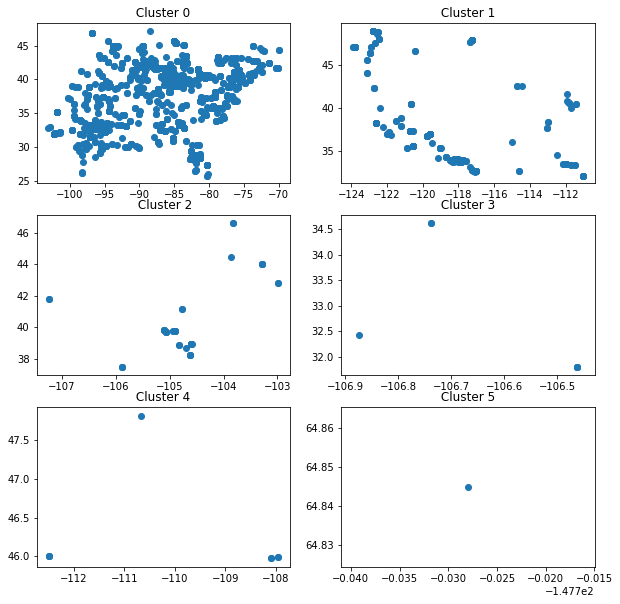

In [47]:
f = plt.figure ( figsize = (10,10))
a = f.add_subplot(321)
a.scatter(x=CLUSTER0['Longitude'], y= CLUSTER0['Latitude'])
plt.title (" Cluster 0 ")
b = f.add_subplot(322)
b.scatter(x=CLUSTER1['Longitude'], y= CLUSTER1['Latitude'])
plt.title (" Cluster 1 ")
c = f.add_subplot(323)
c.scatter(x=CLUSTER2['Longitude'], y= CLUSTER2['Latitude'])
plt.title (" Cluster 2")
d = f.add_subplot(324)
d.scatter(x=CLUSTER3['Longitude'], y= CLUSTER3['Latitude'])
plt.title (" Cluster 3 ")
e = f.add_subplot(325)
e.scatter(x=CLUSTER4['Longitude'], y= CLUSTER4['Latitude'])
plt.title (" Cluster 4 ")
g = f.add_subplot(326)
g.scatter(x=CLUSTER5['Longitude'], y= CLUSTER5['Latitude'])
plt.title (" Cluster 5 ")

## We will work with the data in the Cluster 0 because logically, there will be more clients in a more dense area

In [48]:
# Let us find the unique Zip Codes in Cluster1 
CLUSTER0['Zip Code'] = CLUSTER0['Zip Code'].apply(pd.to_numeric)
y = len (CLUSTER0['Zip Code'].unique())
print (" There are {} unique Zip Codes in Cluster 0 ".format(y))

 There are 90 unique Zip Codes in Cluster 0 


In [49]:
v = CLUSTER0.groupby('Zip Code').count()

## From the dataframe, we can choose the Zip Codes with the most Restaurants. 
### Logically, More Restaurants in a Location equates More Foot Traffic 

In [50]:
# Loop through the dataframe and drop the Zip codes with less tham 300 Restaurants in it 
for index, row in v.iterrows():
    if row['Latitude'] < 450:
        v.drop(index, inplace=True)
        
v.reset_index( inplace = True )


## Using the data to determine the most common restaurants in each Zip Code

In [51]:
# We are merging the rest of the data in the original data frame with the Zipcodes that we have choosen 
Restaurant_data3 = pd.merge(v[["Zip Code"]], CLUSTER0, on = "Zip Code")
Restaurant_data3 = Restaurant_data3.drop(['Longitude','Latitude', "Street Address", 'Lat Long Location'], axis=1 )
Restaurant_data3.groupby("Zip Code").count()

,RestaurantName
Zip Code,
75201,790
75206,599
75211,476
75217,460
75220,587
75231,470
75243,499


In [52]:
# one hot encoding
Restaurant_onehot = pd.get_dummies(Restaurant_data3[['RestaurantName']], prefix="", prefix_sep="")
Restaurant_onehot
#  add Zip Code column back to dataframe
Restaurant_onehot['Zip Code'] = Restaurant_data3['Zip Code'] 

# move neighborhood column to the first column
fixed_columns = [Restaurant_onehot.columns[-1]] + list(Restaurant_onehot.columns[:-1])
Restaurant_onehot = Restaurant_onehot[fixed_columns]

Restaurant_onehot.head()

,Zip Code,#1 CHAMPION BILLARD & GAMES,1 ABC BEER & WINE,15710 FOODA-CHASE TOWER,15757 JAZEN TEA,15789 THE MERCHANT AT LOWER GREENVILLE,1600 PACIFIC SUB TENANT LLC,16155 PRESTON HOLLOW CATERERS LLC,16161 AH BELO DALLAS MORNING NEWS MICROMARKET,16162 - KPMG,...,YUMILICIOUS,YUMMI SUSHI,YUMMY YUMMY RESTAURANT,"Z TO A & COMPANY, INC",ZAGUAN EXPRESS,ZAPP KITCHEN LAO & THAI STREETS EATS LLC,ZATO THAI CUISINE AND SUSHI BAR,ZEE INTERNATIONAL STORE,ZENNA THAI & JAPANESE,ZOE'S KITCHEN
0,75201,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,75201,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,75201,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,75201,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,75201,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
Restaurant_grouped = Restaurant_onehot.groupby('Zip Code').mean().reset_index()
Restaurant_grouped

,Zip Code,#1 CHAMPION BILLARD & GAMES,1 ABC BEER & WINE,15710 FOODA-CHASE TOWER,15757 JAZEN TEA,15789 THE MERCHANT AT LOWER GREENVILLE,1600 PACIFIC SUB TENANT LLC,16155 PRESTON HOLLOW CATERERS LLC,16161 AH BELO DALLAS MORNING NEWS MICROMARKET,16162 - KPMG,...,YUMILICIOUS,YUMMI SUSHI,YUMMY YUMMY RESTAURANT,"Z TO A & COMPANY, INC",ZAGUAN EXPRESS,ZAPP KITCHEN LAO & THAI STREETS EATS LLC,ZATO THAI CUISINE AND SUSHI BAR,ZEE INTERNATIONAL STORE,ZENNA THAI & JAPANESE,ZOE'S KITCHEN
0,75201,0.000000,0.000000,0.002532,0.000000,0.000000,0.002532,0.000000,0.001266,0.001266,...,0.000000,0.000000,0.000000,0.000000,0.001266,0.000000,0.000000,0.000000,0.002532,0.000000
1,75206,0.000000,0.000000,0.000000,0.000000,0.003339,0.000000,0.000000,0.000000,0.000000,...,0.003339,0.000000,0.000000,0.003339,0.000000,0.001669,0.000000,0.000000,0.000000,0.000000
2,75211,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,75217,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.002174,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,75220,0.001704,0.003407,0.000000,0.000000,0.000000,0.000000,0.001704,0.000000,0.000000,...,0.000000,0.001704,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,75231,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004255
6,75243,0.000000,0.000000,0.000000,0.004008,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004008,0.004008,0.000000,0.000000


### Displaying the Top 5 Restaurants in Each Zip Code in Dallas, Texas. 

In [54]:
num_top_venues = 5

for hood in Restaurant_grouped['Zip Code']:
    print("---- {} ----".format(hood))
    temp = Restaurant_grouped[Restaurant_grouped['Zip Code'] == hood].T.reset_index()
    temp.columns = ['Zip Code','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

---- 75201 ----
                    Zip Code  freq
0           ASCENSION COFFEE  0.01
1  FIRST PRESBYTERIAN CHURCH  0.01
2              MURPHY'S DELI  0.01
3          SUBWAY SANDWICHES  0.01
4                     SUBWAY  0.01


---- 75206 ----
                         Zip Code  freq
0            VILLAGE COUNTRY CLUB  0.01
1  RAISING CANE'S CHICKEN FINGERS  0.01
2                           BBBOP  0.01
3             EGYPTIAN RESTAURANT  0.01
4               SUBWAY SANDWICHES  0.01


---- 75211 ----
               Zip Code  freq
0  LITTLE CAESARS PIZZA  0.01
1           BURGER KING  0.01
2       JACK IN THE BOX  0.01
3             MCDONALDS  0.01
4     FRUTERIA GUERRERO  0.01


---- 75217 ----
           Zip Code  freq
0          WINGSTOP  0.01
1      GOLDEN CHICK  0.01
2        A+ ACADEMY  0.01
3         HI FLAMEZ  0.01
4  LRZ CORNER STORE  0.01


---- 75220 ----
       Zip Code  freq
0    EL PAISANO  0.01
1     MCDONALDS  0.01
2        SUBWAY  0.01
3  TODOS AMIGOS  0.01
4     CLUB ONYX 

## Put the most common restaurant in a dataframe

In [55]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [56]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Zip Code']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Restaurant'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Restaurant'.format(ind+1))

# create a new dataframe
Restaurant_venues_sorted = pd.DataFrame(columns=columns)
Restaurant_venues_sorted['Zip Code'] = Restaurant_grouped['Zip Code']

for ind in np.arange(Restaurant_grouped.shape[0]):
    Restaurant_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Restaurant_grouped.iloc[ind, :], num_top_venues)

Restaurant_venues_sorted

,Zip Code,1st Most Common Restaurant,2nd Most Common Restaurant,3rd Most Common Restaurant,4th Most Common Restaurant,5th Most Common Restaurant,6th Most Common Restaurant,7th Most Common Restaurant,8th Most Common Restaurant,9th Most Common Restaurant,10th Most Common Restaurant
0,75201,MURPHY'S DELI,FIRST PRESBYTERIAN CHURCH,ASCENSION COFFEE,STARBUCKS COFFEE,SUBWAY,SUBWAY SANDWICHES,STARBUCKS,SALATA,THE ARTISAN,CYRUS ONE CLUB
1,75206,RAISING CANE'S CHICKEN FINGERS,VILLAGE COUNTRY CLUB,VELVET TACO,EGYPTIAN RESTAURANT,CVS PHARMACY,SUBWAY SANDWICHES,BBBOP,MURPHY'S DELI,THE PEOPLE'S LAST STAND,HIGHLAND DALLAS - KITCHEN #2
2,75211,MCDONALDS,BURGER KING,SUBWAY SANDWICHES,WINGSTOP,JACK IN THE BOX,LITTLE CAESARS PIZZA,FRUTERIA GUERRERO,SUPER MERCADO MONTERREY BAKERY &TOR,TACOS Y TORTAS EL CACHETON,TACOS EL PATRON
3,75217,A+ ACADEMY,SONIC DRIVE IN,HENDERSON CHICKEN,GOLDEN CHICK,LRZ CORNER STORE,WINGSTOP,KWIK MART VALERO,HI FLAMEZ,DON JORGE'S COCINA,PIZZA PATRON #0001
4,75220,7-ELEVEN,HAPPY DOG'S,EL PAISANO,EL MIGUELENO CAFE,SUBWAY SANDWICHES,EL TACASO,SUBWAY,TODOS AMIGOS,AL'S PIZZERIA,CLUB ONYX
5,75231,CVS PHARMACY,FUZZY'S TACO SHOP,WHATABURGER,CHIPOTLE MEXICAN GRILL,CHICK-FIL-A,SUBWAY SANDWICHES,PIZZA HUT,PICASSO'S PIZZA & GRILL,WHICH WICH,HENDERSON CHICKEN
6,75243,SUBWAY,GUCKENHEIMER,JTC BLESS IMPORT,TACO BELL,MCDONALDS,JACK IN THE BOX,JACK IN THE BOX #749,ASIAN GROCERY,ASIAN MINT,ASO ROCK MARKET


### We are going to use PLACER.AI to analyze Foot location with the Foot Traffic 

In [57]:
#Merging both the frist dataframe and the last to get the full address
ZC = pd.merge(v[["Zip Code"]], CLUSTER0, on = "Zip Code")
ZC[(ZC["Zip Code"]== 75201) & (ZC["RestaurantName"]== "MURPHY'S DELI")]

,Zip Code,RestaurantName,Street Address,Lat Long Location,Latitude,Longitude
46,75201,MURPHY'S DELI,325 N SAINT PAUL ST #125,"(37.688453, -97.375862)",37.688453,-97.375862
288,75201,MURPHY'S DELI,3100 MCKINNON ST #190,"(32.797717, -96.811547)",32.797717,-96.811547
430,75201,MURPHY'S DELI,2001 ROSS AVE #150,"(31.539076, -97.138829)",31.539076,-97.138829
447,75201,MURPHY'S DELI,1717 MAIN ST #C100,"(40.606883, -80.271696)",40.606883,-80.271696
493,75201,MURPHY'S DELI,1717 MAIN ST #C100,"(40.606883, -80.271696)",40.606883,-80.271696
761,75201,MURPHY'S DELI,3100 MCKINNON ST #190,"(32.797717, -96.811547)",32.797717,-96.811547


<img src="MD.png">

In [58]:
ZC[(ZC["Zip Code"]== 75206) & (ZC["RestaurantName"]== "RAISING CANE'S CHICKEN FINGERS")]

,Zip Code,RestaurantName,Street Address,Lat Long Location,Latitude,Longitude
871,75206,RAISING CANE'S CHICKEN FINGERS,5030 GREENVILLE AVE,"(32.848515, -96.769979)",32.848515,-96.769979
960,75206,RAISING CANE'S CHICKEN FINGERS,5201 ROSS AVE,"(32.808894, -96.772951)",32.808894,-96.772951
1182,75206,RAISING CANE'S CHICKEN FINGERS,5030 GREENVILLE AVE,"(32.848515, -96.769979)",32.848515,-96.769979
1273,75206,RAISING CANE'S CHICKEN FINGERS,5201 ROSS AVE,"(32.808894, -96.772951)",32.808894,-96.772951


<img src="RCCF.png">

In [59]:
ZC[(ZC["Zip Code"]== 75211) & (ZC["RestaurantName"]== "MCDONALDS")]

,Zip Code,RestaurantName,Street Address,Lat Long Location,Latitude,Longitude
1391,75211,MCDONALDS,1521 N COCKRELL HILL RD,"(32.763549, -96.895452)",32.763549,-96.895452
1392,75211,MCDONALDS,450 N MERRIFIELD RD,"(32.749369, -96.922622)",32.749369,-96.922622
1492,75211,MCDONALDS,4223 W ILLINOIS AVE,"(32.72043, -96.889729)",32.720430,-96.889729
1499,75211,MCDONALDS,2747 FORT WORTH AVE,"(32.757716, -96.865794)",32.757716,-96.865794
1662,75211,MCDONALDS,1521 N COCKRELL HILL RD,"(32.763549, -96.895452)",32.763549,-96.895452
1688,75211,MCDONALDS,2747 FORT WORTH AVE,"(32.757716, -96.865794)",32.757716,-96.865794
1719,75211,MCDONALDS,450 N MERRIFIELD RD,"(32.749369, -96.922622)",32.749369,-96.922622


<img src="MD1.png">
<img src="MD2.png">
<img src="MD3.png">

In [60]:
ZC[(ZC["Zip Code"]== 75217) & (ZC["RestaurantName"]== "SONIC DRIVE IN")]

,Zip Code,RestaurantName,Street Address,Lat Long Location,Latitude,Longitude
1932,75217,SONIC DRIVE IN,1739 S ST. AUGUSTINE DR #B,"(32.681402, -96.657248)",32.681402,-96.657248
2119,75217,SONIC DRIVE IN,8126 LAKE JUNE RD,"(32.734166, -96.6817)",32.734166,-96.681700
2200,75217,SONIC DRIVE IN,8126 LAKE JUNE RD,"(32.734166, -96.6817)",32.734166,-96.681700
2269,75217,SONIC DRIVE IN,1739 S ST. AUGUSTINE DR #B,"(32.681402, -96.657248)",32.681402,-96.657248


<img src="SDI.png">

In [61]:
ZC[(ZC["Zip Code"]== 75220) & (ZC["RestaurantName"]== "HAPPY DOG'S")]

,Zip Code,RestaurantName,Street Address,Lat Long Location,Latitude,Longitude
2505,75220,HAPPY DOG'S,10788 HARRY HINES BLVD #H16,"(32.874047, -96.883685)",32.874047,-96.883685
2756,75220,HAPPY DOG'S,10788 HARRY HINES BLVD #H1,"(32.874047, -96.883685)",32.874047,-96.883685
2799,75220,HAPPY DOG'S,10788 HARRY HINES BLVD #H16,"(32.874047, -96.883685)",32.874047,-96.883685
2907,75220,HAPPY DOG'S,10788 HARRY HINES BLVD #H1,"(32.874047, -96.883685)",32.874047,-96.883685


In [62]:
ZC[(ZC["Zip Code"]== 75231) & (ZC["RestaurantName"]== "FUZZY'S TACO SHOP")]

,Zip Code,RestaurantName,Street Address,Lat Long Location,Latitude,Longitude
3044,75231,FUZZY'S TACO SHOP,10910 N CENTRAL EXPW #800,"(32.897933, -96.768689)",32.897933,-96.768689
3114,75231,FUZZY'S TACO SHOP,6760 ABRAMS RD #101,"(32.867394, -96.74276)",32.867394,-96.742760
3206,75231,FUZZY'S TACO SHOP,6760 ABRAMS RD #101,"(32.867394, -96.74276)",32.867394,-96.742760
3263,75231,FUZZY'S TACO SHOP,10910 N CENTRAL EXPW #800,"(32.897933, -96.768689)",32.897933,-96.768689


<img src="FUXT.png">

In [63]:
ZC[(ZC["Zip Code"]== 75243) & (ZC["RestaurantName"]== "SUBWAY")]

,Zip Code,RestaurantName,Street Address,Lat Long Location,Latitude,Longitude
3414,75243,SUBWAY,11260 N CENTRAL EXPW,"(32.901071, -96.768622)",32.901071,-96.768622
3415,75243,SUBWAY,9410 WALNUT ST #116,"(39.295083, -85.948166)",39.295083,-85.948166
3428,75243,SUBWAY,8440 ABRAMS RD #404,"(32.894641, -96.739973)",32.894641,-96.739973
3518,75243,SUBWAY,12800 ABRAMS RD,"(32.92115, -96.735315)",32.921150,-96.735315
3547,75243,SUBWAY,9730 ABRAMS RD #109,"(32.908596, -96.735371)",32.908596,-96.735371
3622,75243,SUBWAY,13440 TI BLVD #1,"(32.930767, -96.748771)",32.930767,-96.748771
3679,75243,SUBWAY,12800 ABRAMS RD,"(32.92115, -96.735315)",32.921150,-96.735315
3723,75243,SUBWAY,8440 ABRAMS RD #404,"(32.894641, -96.739973)",32.894641,-96.739973
3778,75243,SUBWAY,9730 ABRAMS RD #109,"(32.908596, -96.735371)",32.908596,-96.735371
3780,75243,SUBWAY,11260 N CENTRAL EXPW,"(32.901071, -96.768622)",32.901071,-96.768622


<img src="SW.png">

Judging from our analysis with placer.ai, Using the available data, 

1492	75211	MCDONALDS	4223 W ILLINOIS AVE	(32.72043, -96.889729)	32.720430	-96.889729 with 11.5k Customers and 14.5k Customers 

4223 W ILLINOIS AVE has the most foot traffic with Location data (32.72043, -96.889729). This 

In [67]:
ZC[(ZC["Zip Code"]== 75211) & (ZC["RestaurantName"]== "MCDONALDS") & (ZC["Latitude"]== 32.720430)]

,Zip Code,RestaurantName,Street Address,Lat Long Location,Latitude,Longitude
1492,75211,MCDONALDS,4223 W ILLINOIS AVE,"(32.72043, -96.889729)",32.72043,-96.889729



## Thank You! 